# Importing Basic Libraries

In [1]:
import numpy as np
import pandas as pd

import warnings
warnings.filterwarnings('ignore')

# Loading Data

In [2]:
covid_df = pd.read_csv('covid_19_clean_complete.csv')
covid_df.head()

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active,WHO Region
0,NaN,Afghanistan,33.93911,67.709953,2020-01-22,0,0,0,0,Eastern Mediterranean
1,NaN,Albania,41.15330,20.168300,2020-01-22,0,0,0,0,Europe
2,NaN,Algeria,28.03390,1.659600,2020-01-22,0,0,0,0,Africa
3,NaN,Andorra,42.50630,1.521800,2020-01-22,0,0,0,0,Europe
4,NaN,Angola,-11.20270,17.873900,2020-01-22,0,0,0,0,Africa


# Data Cleaning & EDA

In [3]:
covid_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49068 entries, 0 to 49067
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Province/State  14664 non-null  object 
 1   Country/Region  49068 non-null  object 
 2   Lat             49068 non-null  float64
 3   Long            49068 non-null  float64
 4   Date            49068 non-null  object 
 5   Confirmed       49068 non-null  int64  
 6   Deaths          49068 non-null  int64  
 7   Recovered       49068 non-null  int64  
 8   Active          49068 non-null  int64  
 9   WHO Region      49068 non-null  object 
dtypes: float64(2), int64(4), object(4)
memory usage: 3.7+ MB


In [4]:
covid_df['Date'] = pd.to_datetime(covid_df['Date'])

In [5]:
covid_df.describe()

,Lat,Long,Date,Confirmed,Deaths,Recovered,Active
count,49068.000000,49068.000000,49068,4.906800e+04,49068.000000,4.906800e+04,4.906800e+04
mean,21.433730,23.528236,2020-04-24 12:00:00,1.688490e+04,884.179160,7.915713e+03,8.085012e+03
min,-51.796300,-135.000000,2020-01-22 00:00:00,0.000000e+00,0.000000,0.000000e+00,-1.400000e+01
25%,7.873054,-15.310100,2020-03-08 18:00:00,4.000000e+00,0.000000,0.000000e+00,0.000000e+00
50%,23.634500,21.745300,2020-04-24 12:00:00,1.680000e+02,2.000000,2.900000e+01,2.600000e+01
75%,41.204380,80.771797,2020-06-10 06:00:00,1.518250e+03,30.000000,6.660000e+02,6.060000e+02
max,71.706900,178.065000,2020-07-27 00:00:00,4.290259e+06,148011.000000,1.846641e+06,2.816444e+06
std,24.950320,70.442740,NaN,1.273002e+05,6313.584411,5.480092e+04,7.625890e+04


In [6]:
covid_df[covid_df['Country/Region']=='India']

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active,WHO Region
129,NaN,India,20.593684,78.96288,2020-01-22,0,0,0,0,South-East Asia
390,NaN,India,20.593684,78.96288,2020-01-23,0,0,0,0,South-East Asia
651,NaN,India,20.593684,78.96288,2020-01-24,0,0,0,0,South-East Asia
912,NaN,India,20.593684,78.96288,2020-01-25,0,0,0,0,South-East Asia
1173,NaN,India,20.593684,78.96288,2020-01-26,0,0,0,0,South-East Asia
...,...,...,...,...,...,...,...,...,...,...
47892,NaN,India,20.593684,78.96288,2020-07-23,1288108,30601,817209,440298,South-East Asia
48153,NaN,India,20.593684,78.96288,2020-07-24,1337024,31358,849432,456234,South-East Asia
48414,NaN,India,20.593684,78.96288,2020-07-25,1385635,32060,885573,468002,South-East Asia
48675,NaN,India,20.593684,78.96288,2020-07-26,1435616,32771,917568,485277,South-East Asia


In [7]:
covid_df.isna().sum()

Province/State    34404
Country/Region        0
Lat                   0
Long                  0
Date                  0
Confirmed             0
Deaths                0
Recovered             0
Active                0
WHO Region            0
dtype: int64

* We are not dealing with the null values, since it is irrelevant for this problem statement.

In [8]:
covid_df[~covid_df['Province/State'].isna()]['Country/Region'].unique()

array(['Australia', 'Canada', 'China', 'Denmark', 'Greenland', 'France',
       'Netherlands', 'United Kingdom'], dtype=object)

In [9]:
covid_df[(covid_df['Province/State'].isna()) & (~covid_df['Province/State'].isna())]['Country/Region'].nunique()

0

# Using Plotly Library to Visualise the Dataset

In [10]:
import plotly.express as px

## Choropleth

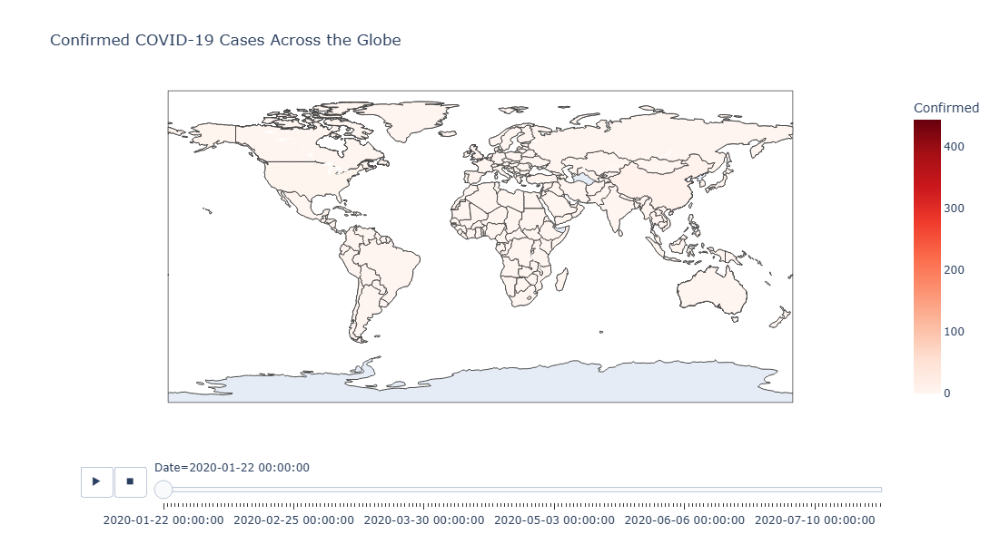

In [11]:
fig = px.choropleth(
    covid_df,
    locations='Country/Region',
    locationmode='country names',
    color='Confirmed',
    hover_name='Country/Region',
    animation_frame='Date',
    title = 'Confirmed COVID-19 Cases Across the Globe',
    color_continuous_scale='Reds',
    width=1000,
    height=600 
)

fig.show()

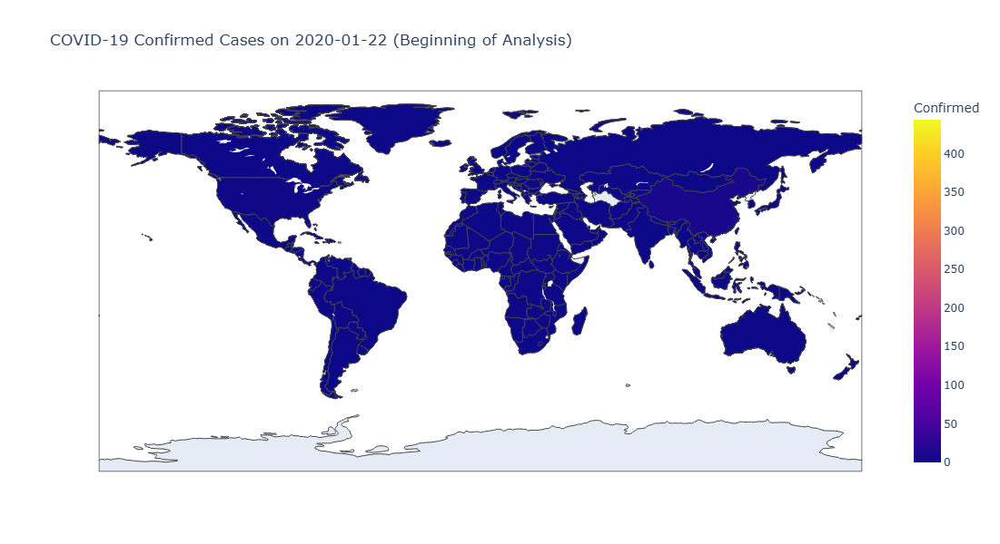

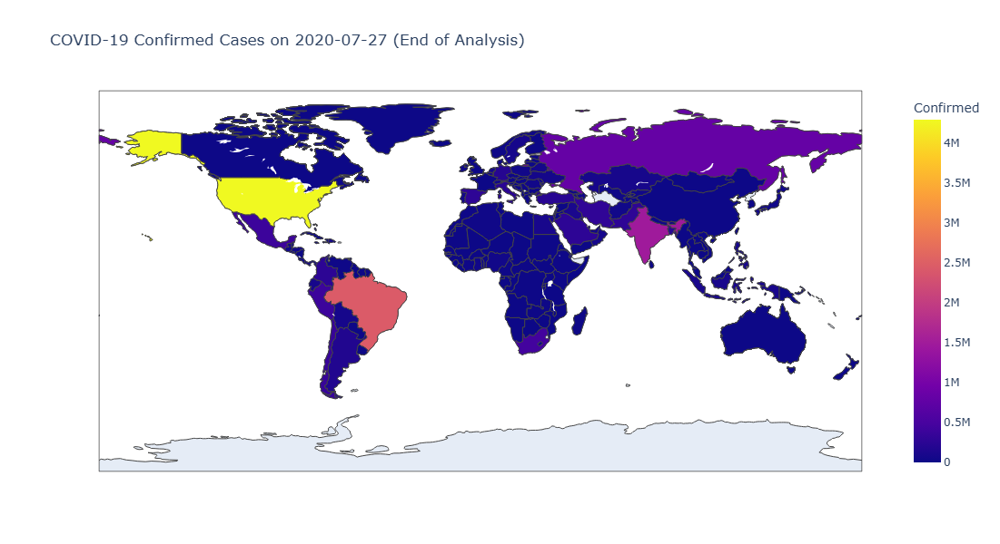

In [12]:
# Start of the analysis
start_date = covid_df['Date'].min()
start_frame_df = covid_df[covid_df['Date'] == start_date]

fig = px.choropleth(
    start_frame_df,
    locations='Country/Region',
    locationmode='country names',
    color='Confirmed',
    hover_name='Country/Region',
    title=f'COVID-19 Confirmed Cases on {start_date.date()} (Beginning of Analysis)',
    width=1000,
    height=600
)
fig.show()

# Last day of the analysis
latest_date = covid_df['Date'].max()
last_frame_df = covid_df[covid_df['Date'] == latest_date]

fig = px.choropleth(
    last_frame_df,
    locations='Country/Region',
    locationmode='country names',
    color='Confirmed',
    hover_name='Country/Region',
    title=f'COVID-19 Confirmed Cases on {latest_date.date()} (End of Analysis)',
    width=1000,
    height=600
)
fig.show()

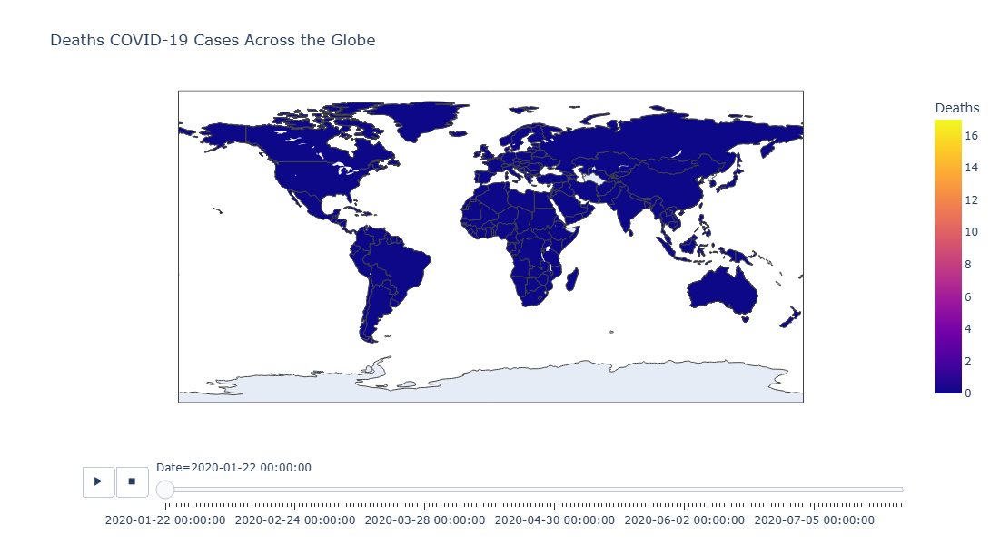

In [13]:
fig = px.choropleth(
    covid_df,
    locations='Country/Region',
    locationmode='country names',
    color='Deaths',
    hover_name='Country/Region',
    animation_frame='Date',
    title = 'Deaths COVID-19 Cases Across the Globe',
    width=1000,
    height=600 
)

fig.show()

## Barplot

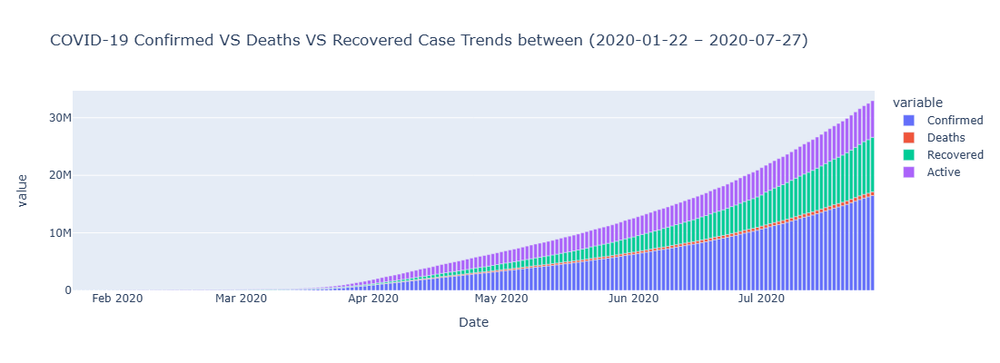

In [14]:
bar = px.bar(
    covid_df.groupby('Date').sum().reset_index(),
    x='Date',
    y=['Confirmed','Deaths','Recovered','Active'],
    width = 1000,
    height = 400,
    title= f'COVID-19 Confirmed VS Deaths VS Recovered Case Trends between ({start_date.date()} – {latest_date.date()})'
)
bar.show()

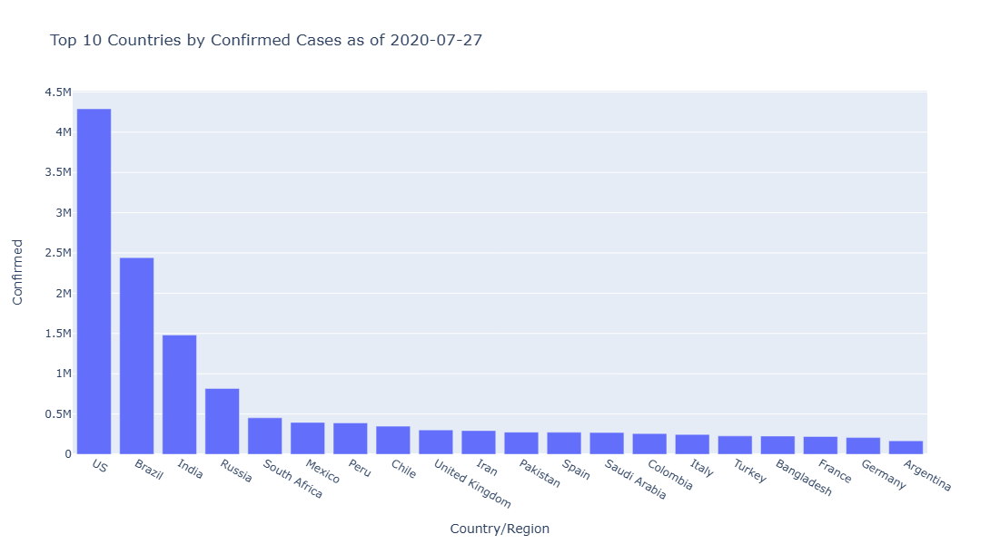

In [15]:
total_by_country = covid_df[covid_df['Date'] == latest_date].groupby('Country/Region')['Confirmed'].sum().reset_index()
top_countries = total_by_country.sort_values(by='Confirmed', ascending=False).head(20)

fig = px.bar(
    top_countries,
    x='Country/Region',
    y='Confirmed',
    title=f'Top 10 Countries by Confirmed Cases as of {latest_date.date()}',
    width=1000,
    height=600
)
fig.show()

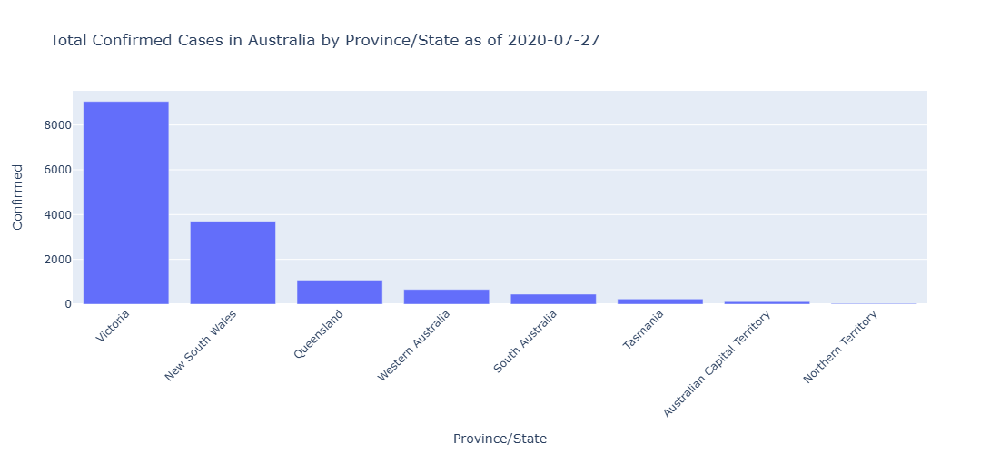

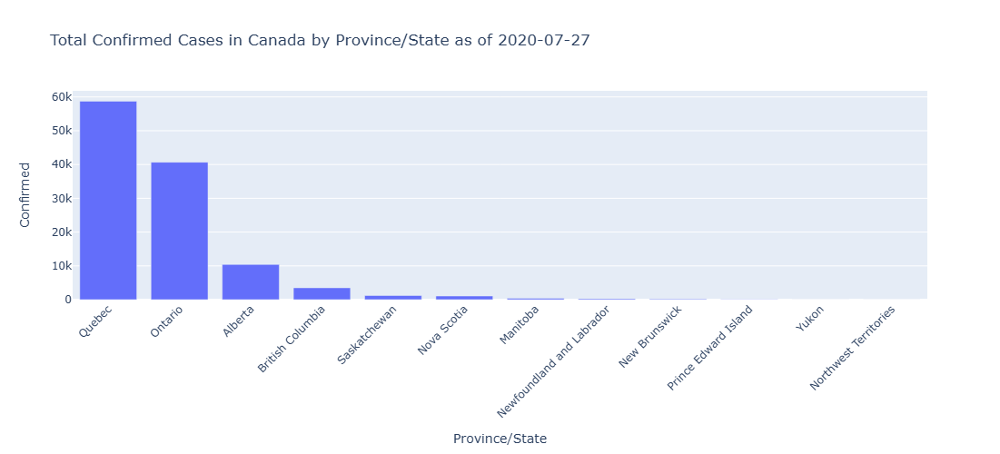

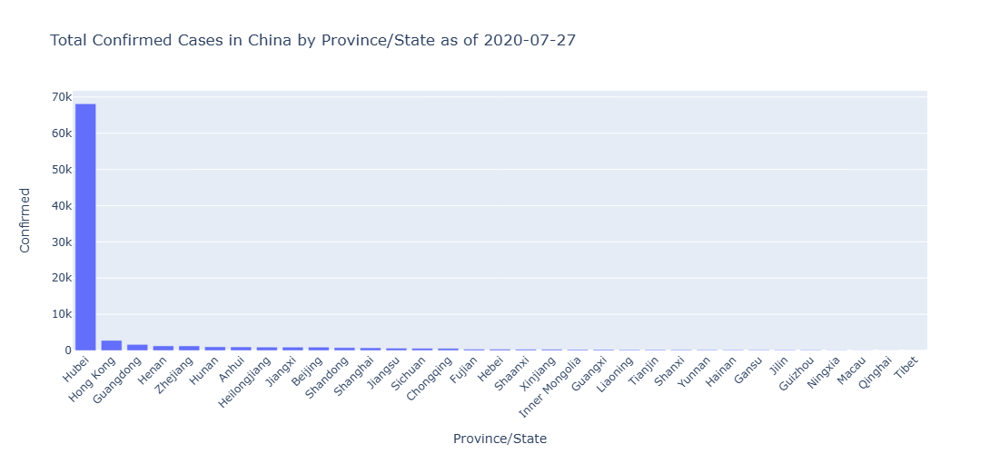

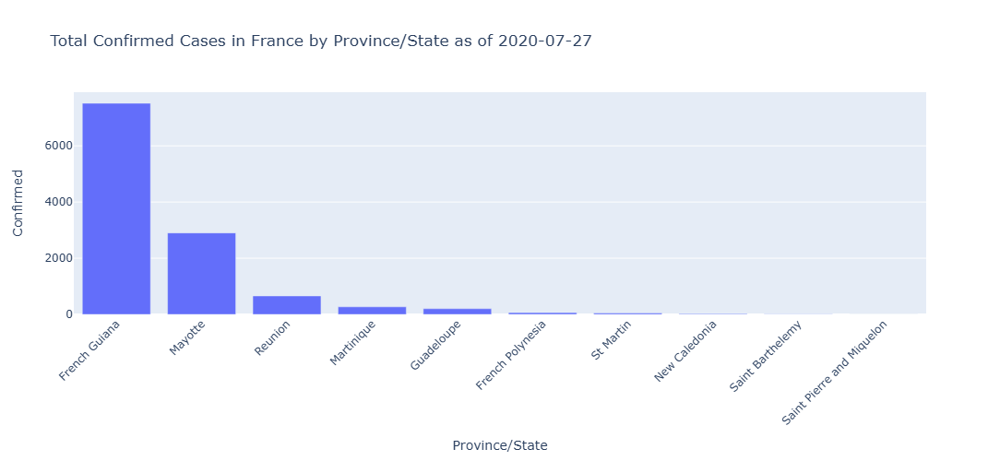

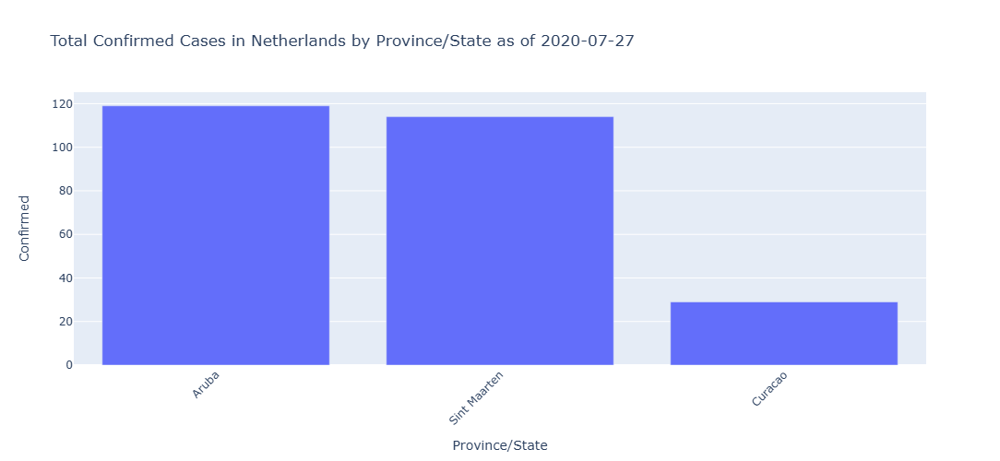

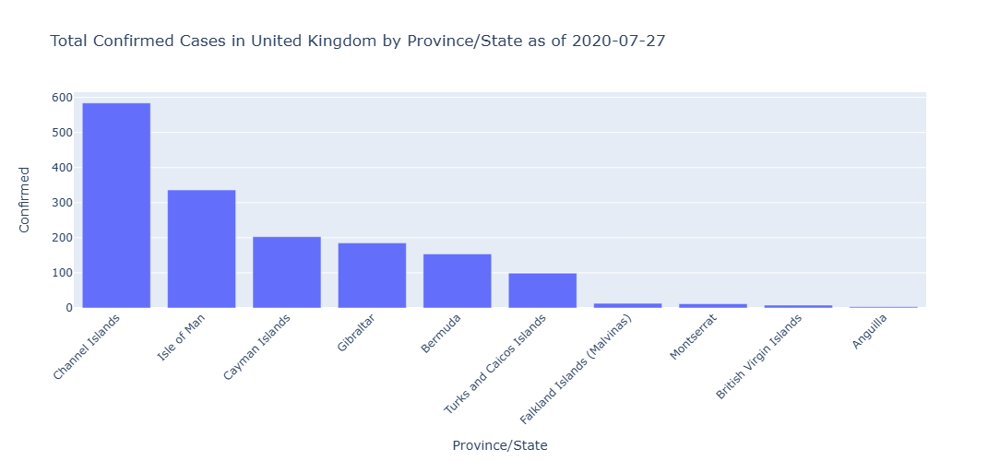

In [16]:
for country in ['Australia', 'Canada', 'China', 'France', 'Netherlands', 'United Kingdom']:
    
    # Filter for the given country and latest date
    filtered_df = covid_df[(covid_df['Date'] == latest_date) & (covid_df['Country/Region'] == country)]
    
    # Group by Province/State
    state_data = filtered_df.groupby('Province/State')['Confirmed'].sum().reset_index()
    
    # Remove null province/state values if needed
    state_data = state_data[state_data['Province/State'].notnull()]
    
    fig = px.bar(
        state_data.sort_values(by='Confirmed', ascending=False),
        x='Province/State',
        y='Confirmed',
        title=f'Total Confirmed Cases in {country} by Province/State as of {latest_date.date()}',
        width=1000,
        height=500
    )
    
    fig.update_layout(xaxis_tickangle=-45)
    fig.show()

* We are not considering `Greenland` and `Denmark` here, since they only have one province.

## Line plot

In [17]:
cov_1 = covid_df.groupby('Country/Region')[['Confirmed','Deaths','Recovered','Active']].sum()
cov_c = cov_1.sort_values('Confirmed',ascending=False).head(5)
top_confirmed = cov_c.index.tolist()
top_confirmed

['US', 'Brazil', 'Russia', 'India', 'Spain']

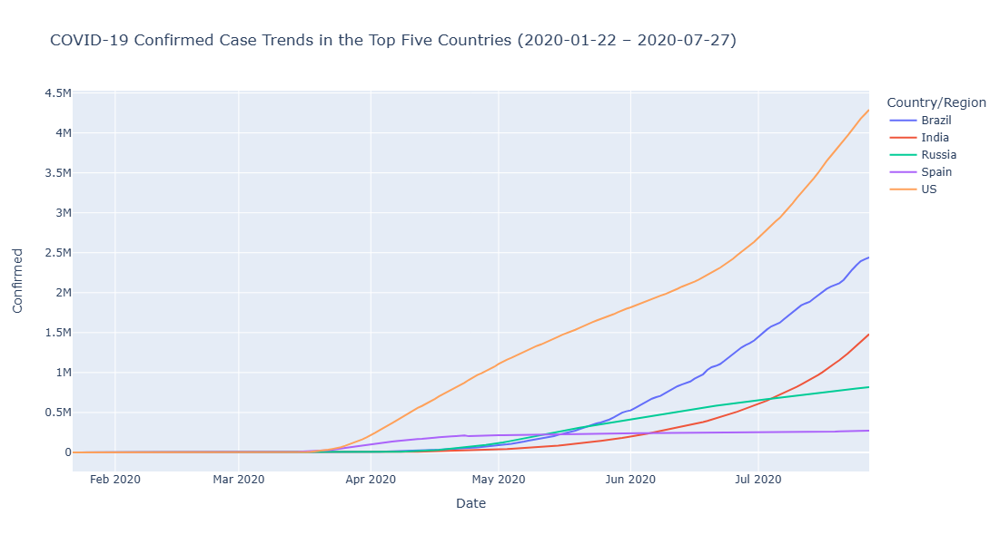

In [18]:
line = px.line(
    covid_df[covid_df['Country/Region'].isin(top_confirmed)],
    x='Date',
    y='Confirmed',
    color='Country/Region',
    title= f'COVID-19 Confirmed Case Trends in the Top Five Countries ({start_date.date()} – {latest_date.date()})',
    width = 1000,
    height = 600
)
line.show()

## Treemaps

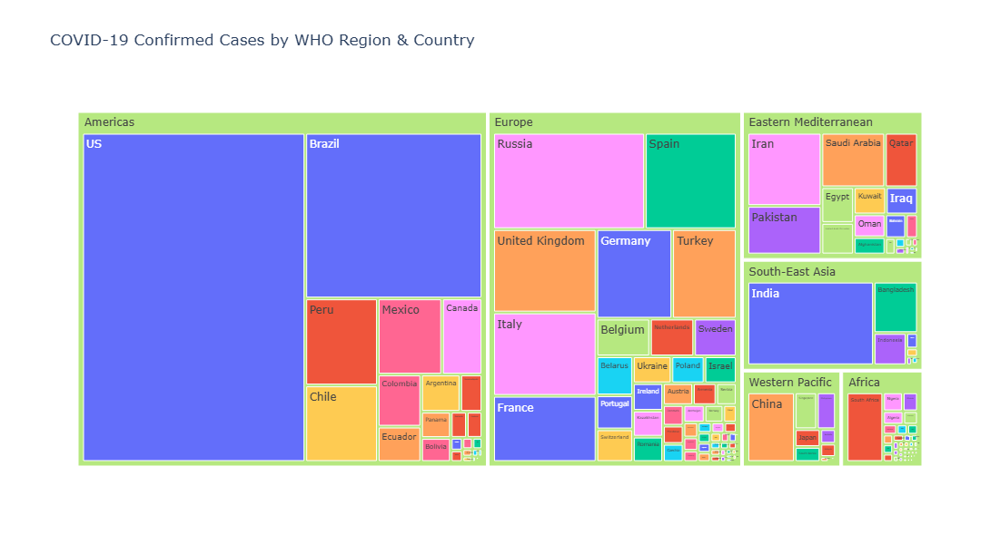

In [19]:
tree = px.treemap(
    covid_df.groupby(['WHO Region', 'Country/Region']).agg({'Confirmed': 'sum','Deaths': 'sum','Recovered': 'sum'}).reset_index(),
    path=['WHO Region', 'Country/Region'],
    values='Confirmed',
    title='COVID-19 Confirmed Cases by WHO Region & Country',
    color='Country/Region',
    hover_data=['Deaths', 'Recovered'],
    width = 1000,
    height = 600
)
tree.show()

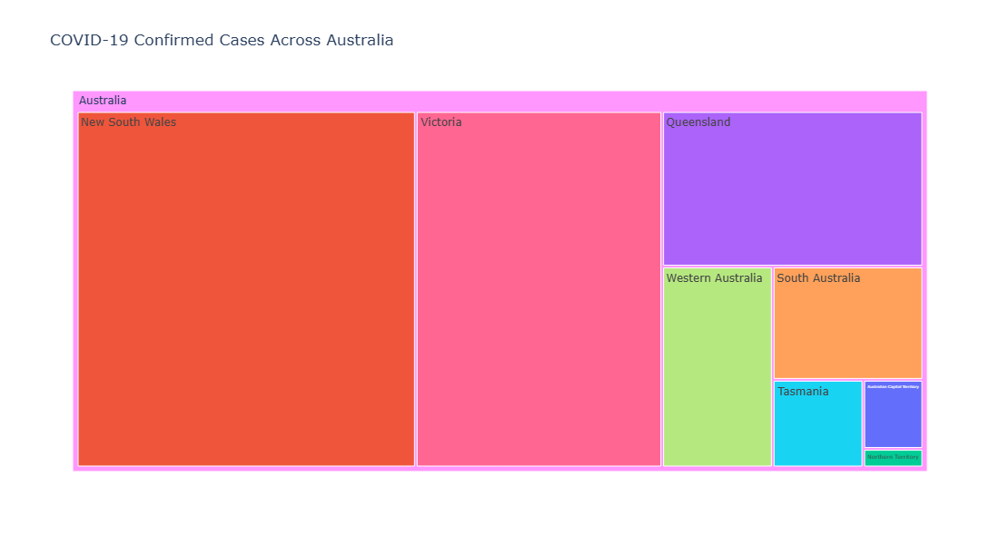

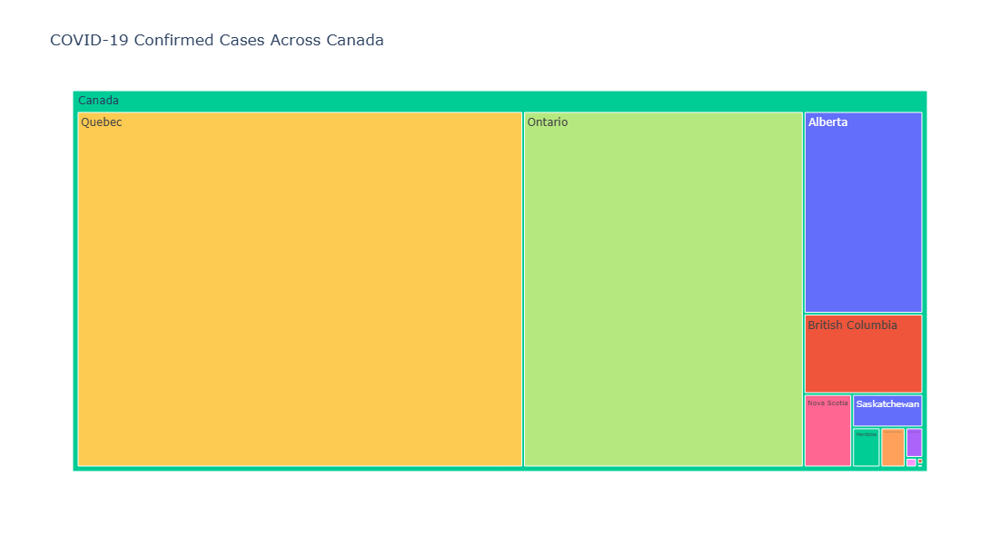

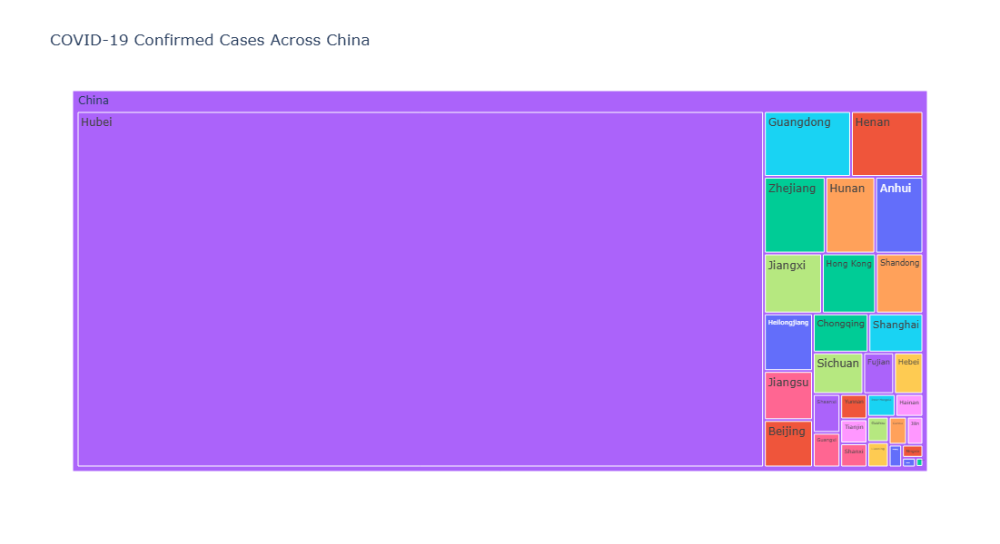

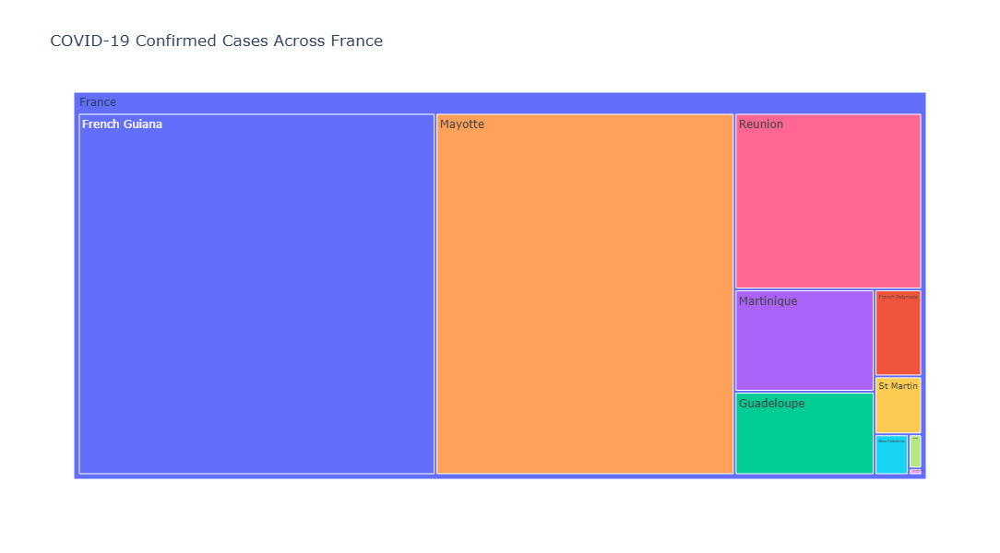

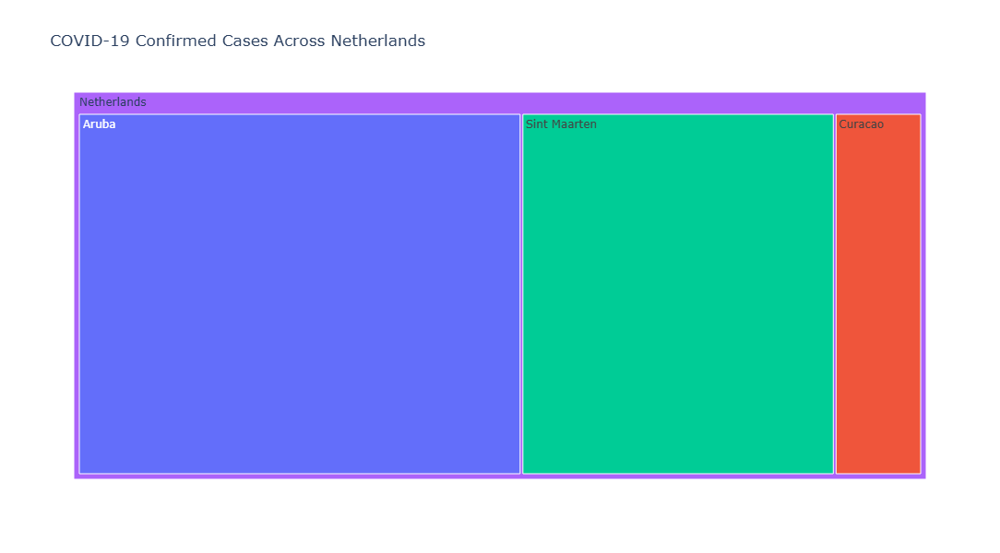

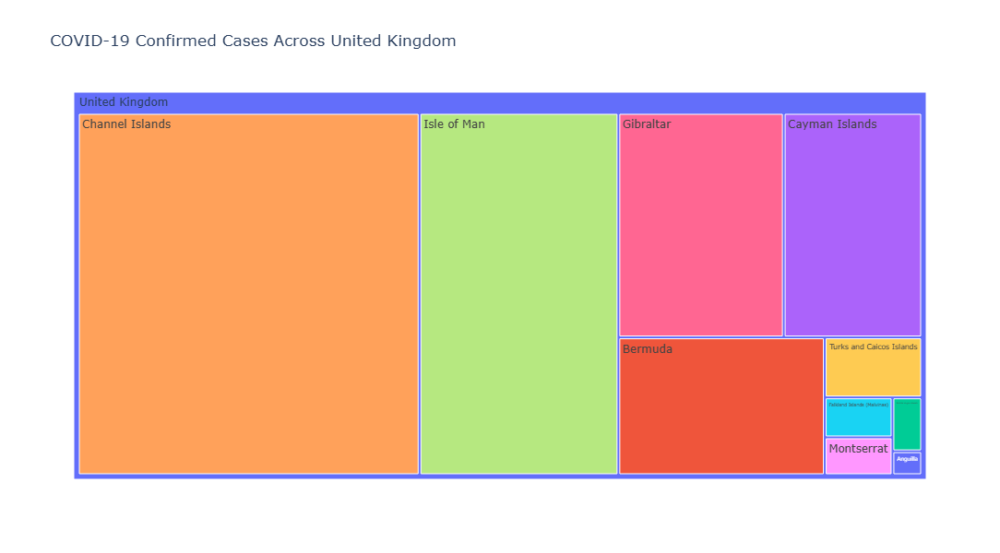

In [20]:
for country in ['Australia', 'Canada', 'China', 'France', 'Netherlands', 'United Kingdom']:
    tree = px.treemap(
        covid_df[covid_df['Country/Region']==country].groupby(['Country/Region','Province/State']).agg({'Confirmed': 'sum','Deaths': 'sum','Recovered': 'sum'}).reset_index(),
        path=['Country/Region','Province/State'],
        values='Confirmed',
        title=f'COVID-19 Confirmed Cases Across {country}',
        color='Province/State',
        hover_data=['Deaths', 'Recovered'],
        width = 1000,
        height = 600
    )
    tree.show()

## Sunburst

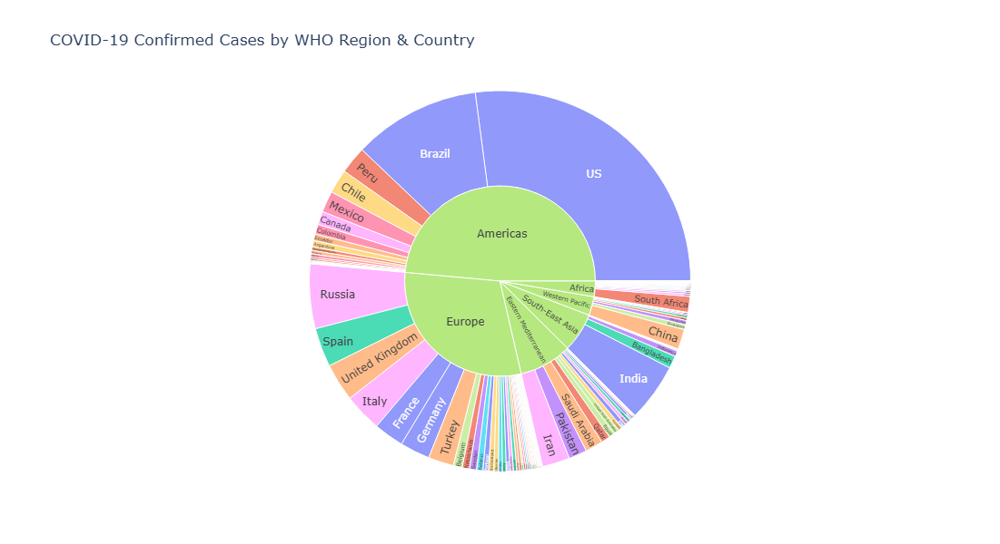

In [21]:
sunburst = px.sunburst(
    covid_df.groupby(['WHO Region', 'Country/Region']).agg({'Confirmed': 'sum','Deaths': 'sum','Recovered': 'sum'}).reset_index(),
    path=['WHO Region', 'Country/Region'],
    values='Confirmed',
    title='COVID-19 Confirmed Cases by WHO Region & Country',
    color='Country/Region',
    hover_data=['Deaths', 'Recovered'],
    width = 600,
    height = 600
)
sunburst.show()

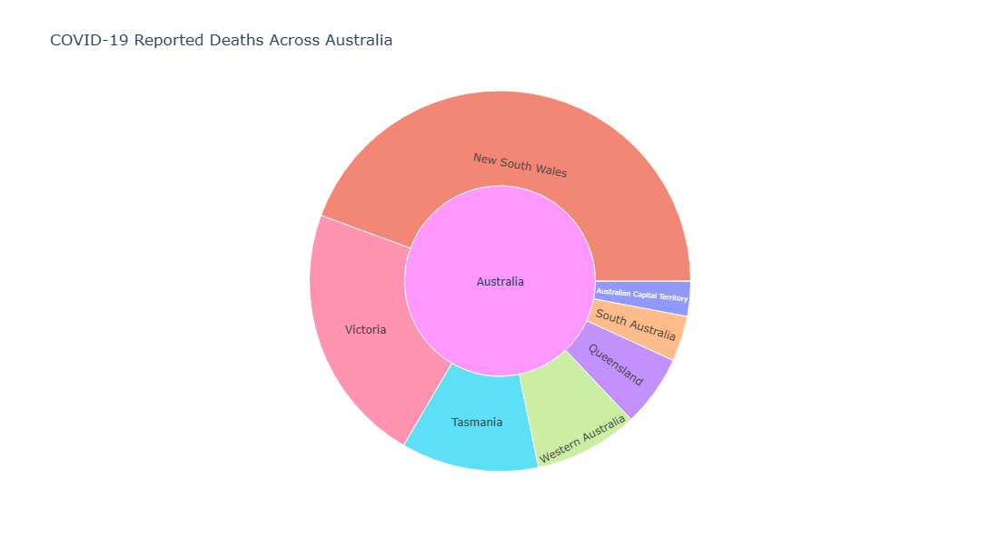

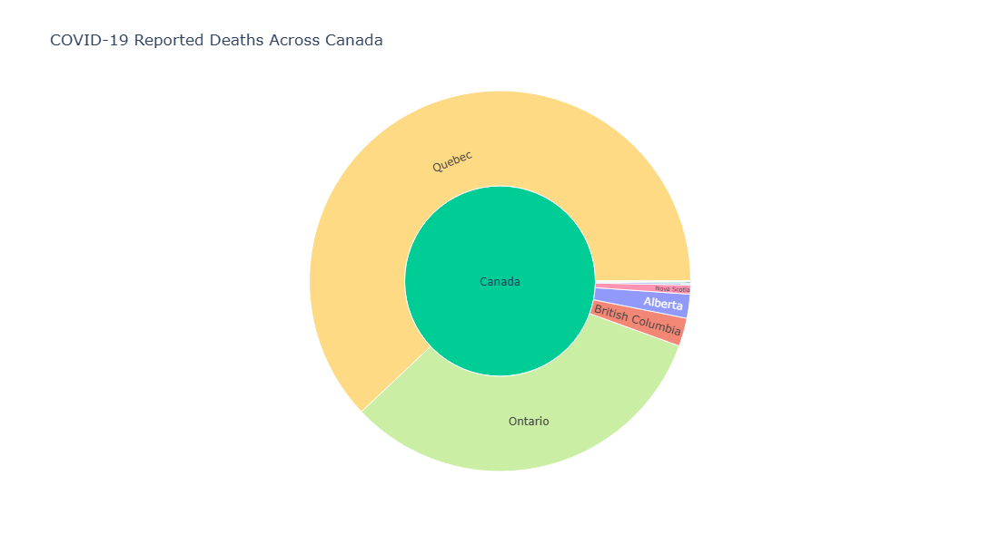

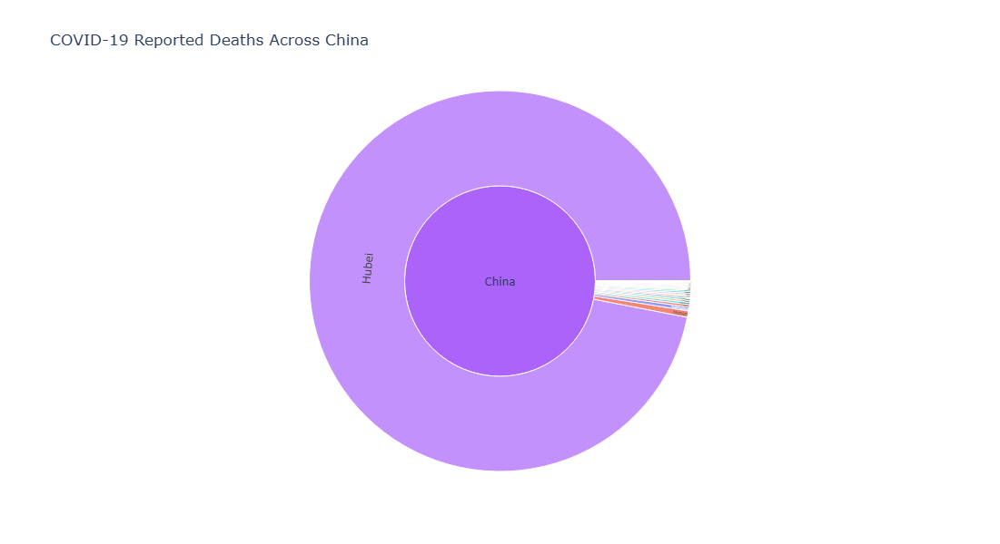

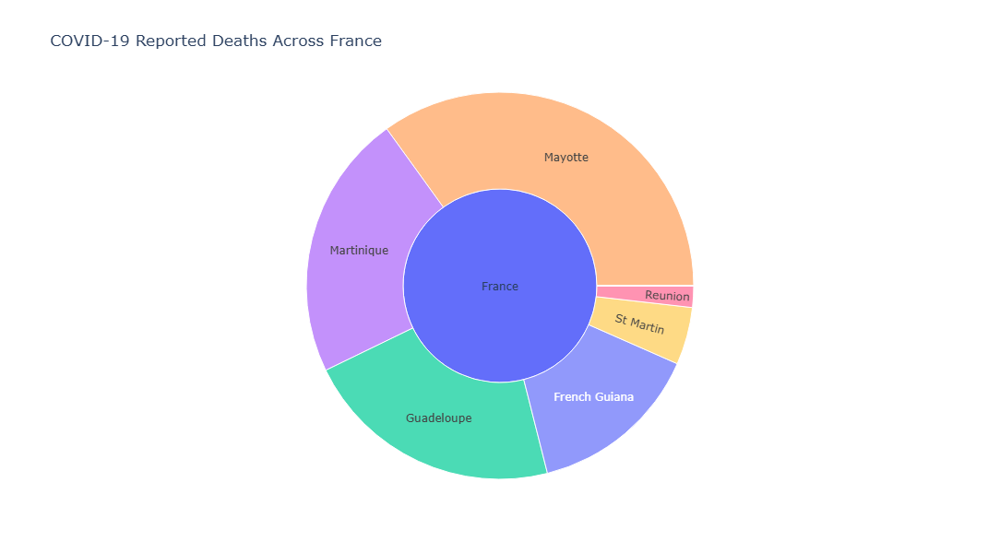

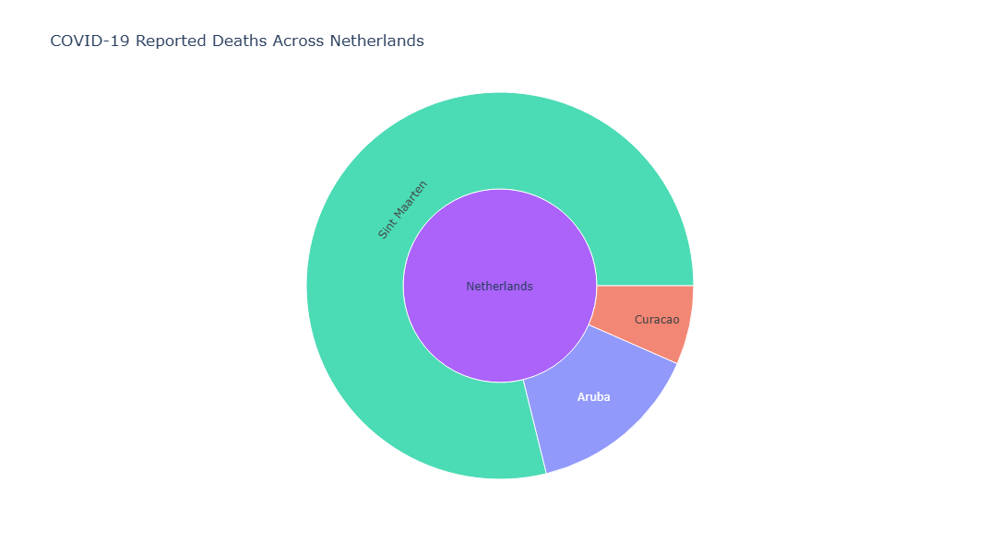

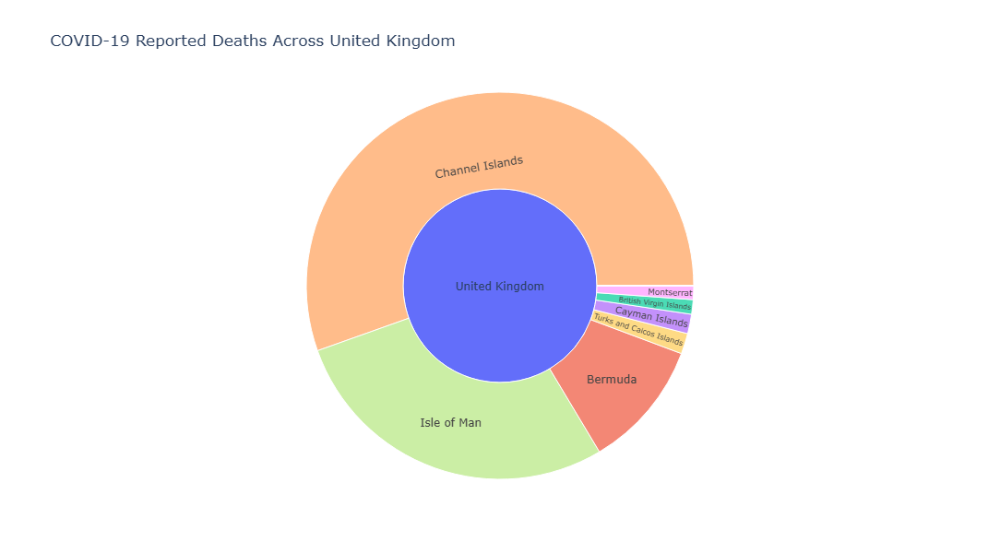

In [22]:
for country in ['Australia', 'Canada', 'China', 'France', 'Netherlands', 'United Kingdom']:
    sunburst = px.sunburst(
        covid_df[covid_df['Country/Region']==country].groupby(['Country/Region','Province/State']).agg({'Confirmed': 'sum','Deaths': 'sum','Recovered': 'sum'}).reset_index(),
        path=['Country/Region','Province/State'],
        values='Deaths',
        title=f'COVID-19 Reported Deaths Across {country}',
        color='Province/State',
        hover_data=['Confirmed', 'Recovered'],
        width=600,
        height = 600
    )
    sunburst.show()

# Using Facebook Prophet library for buiding time series models

In [23]:
df_meta = covid_df[['Date', 'Confirmed']].copy()
df_meta.rename(columns={'Date': 'ds', 'Confirmed': 'y'}, inplace=True)

## Forecasting COVID-19 Confirmed Cases in next 30 days for randomly chosen 5 countries

Processing: Germany


14:14:38 - cmdstanpy - INFO - Chain [1] start processing
14:14:39 - cmdstanpy - INFO - Chain [1] done processing


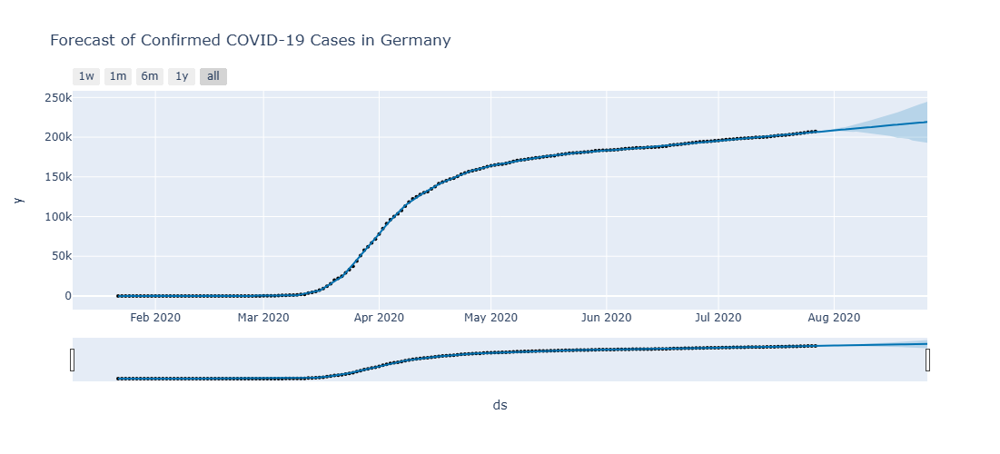

14:14:39 - cmdstanpy - INFO - Chain [1] start processing


Processing: Italy


14:14:39 - cmdstanpy - INFO - Chain [1] done processing


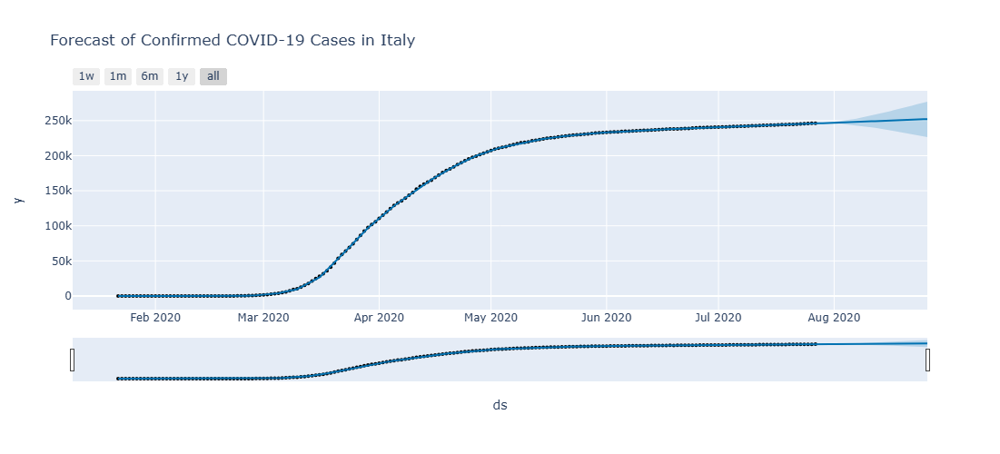

14:14:39 - cmdstanpy - INFO - Chain [1] start processing
14:14:39 - cmdstanpy - INFO - Chain [1] done processing


Processing: Cambodia


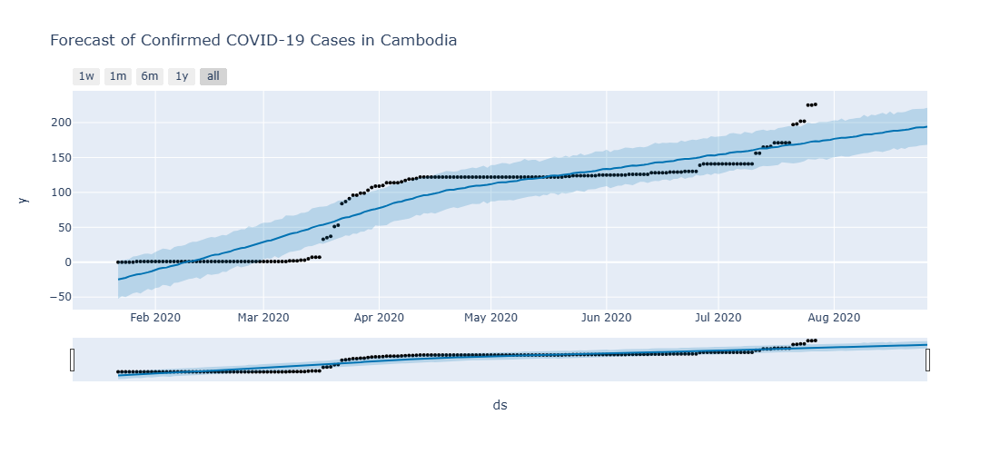

14:14:40 - cmdstanpy - INFO - Chain [1] start processing
14:14:40 - cmdstanpy - INFO - Chain [1] done processing


Processing: Comoros


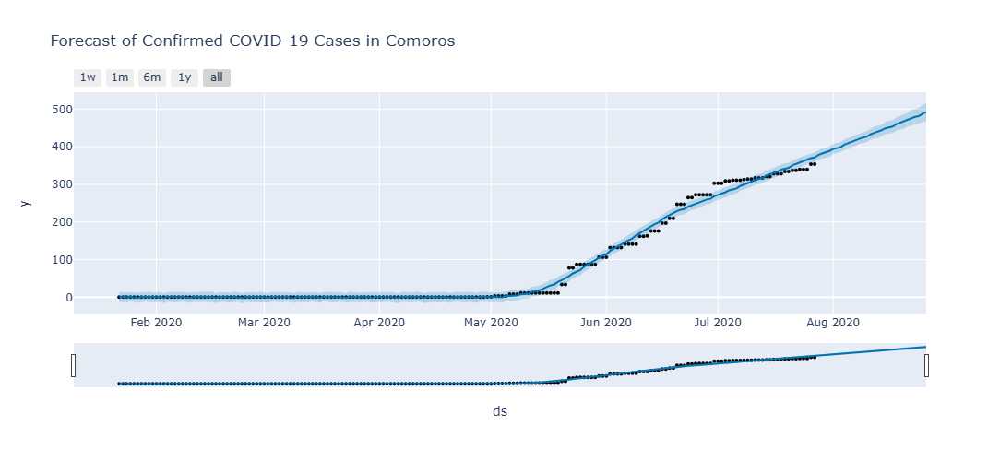

14:14:40 - cmdstanpy - INFO - Chain [1] start processing
14:14:40 - cmdstanpy - INFO - Chain [1] done processing


Processing: Mongolia


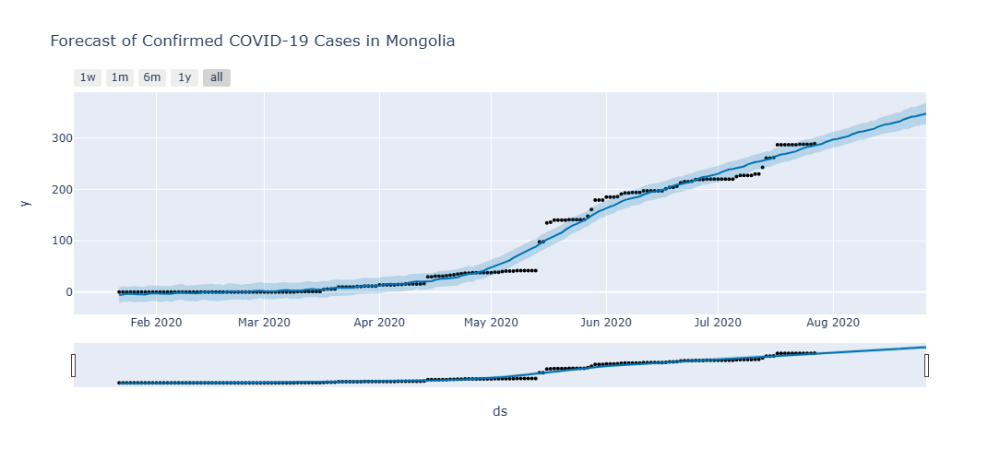

In [24]:
from prophet import Prophet
from prophet.plot import plot_plotly
import plotly.graph_objs as go
import random

random.seed(4)

# list of unique countries
countries = covid_df['Country/Region'].unique()

# Randomly select 5 countries
random_countries = random.sample(list(countries), 5)

# Loop through each selected country
for country in random_countries:
    print(f"Processing: {country}")

    df_meta = covid_df[covid_df['Country/Region'] == country]
    country_ts = df_meta.groupby('Date')['Confirmed'].sum().reset_index()
    country_ts.rename(columns={'Date': 'ds', 'Confirmed': 'y'}, inplace=True)

    # Fit the model
    model = Prophet()
    model.fit(country_ts)

    # Create future dates and forecast
    future = model.make_future_dataframe(periods=30)
    forecast = model.predict(future)

    # Visualising
    fig = plot_plotly(model, forecast)
    fig.update_layout(title=f"Forecast of Confirmed COVID-19 Cases in {country}", width=900, height=500)
    fig.show()

## Forecasting COVID-19 Deaths in next 30 days for randomly chosen five countries

14:14:40 - cmdstanpy - INFO - Chain [1] start processing


Processing: Germany


14:14:41 - cmdstanpy - INFO - Chain [1] done processing


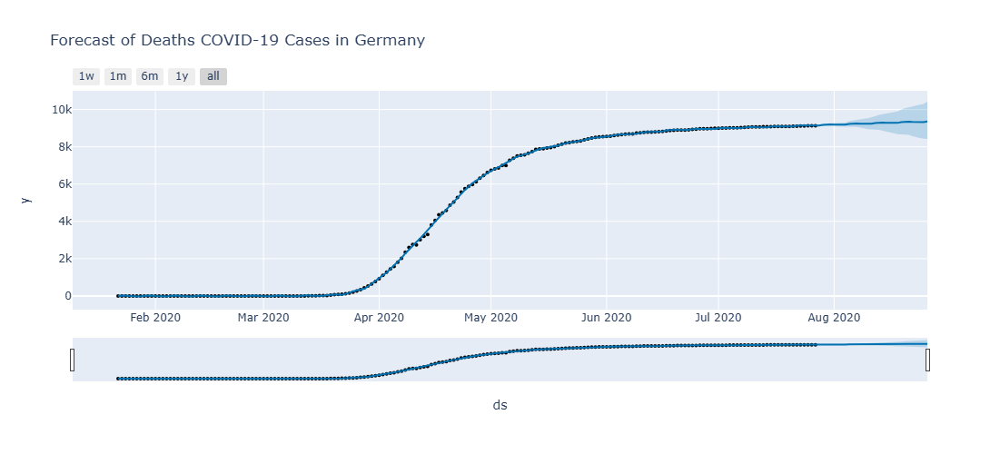

14:14:41 - cmdstanpy - INFO - Chain [1] start processing


Processing: Italy


14:14:41 - cmdstanpy - INFO - Chain [1] done processing


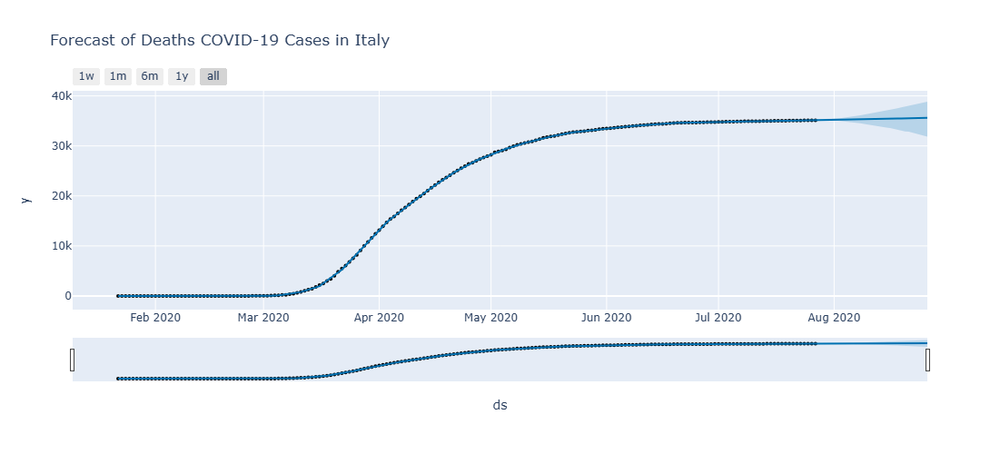

Processing: Cambodia


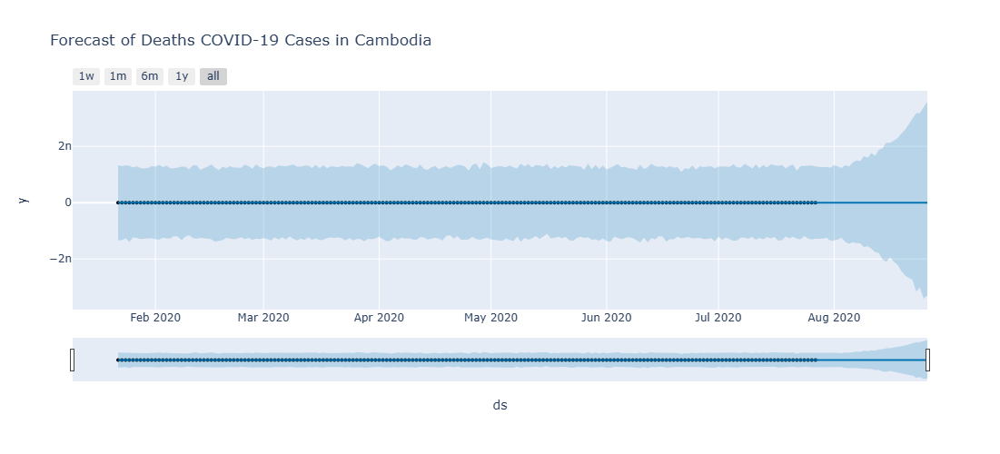

14:14:41 - cmdstanpy - INFO - Chain [1] start processing
14:14:41 - cmdstanpy - INFO - Chain [1] done processing


Processing: Comoros


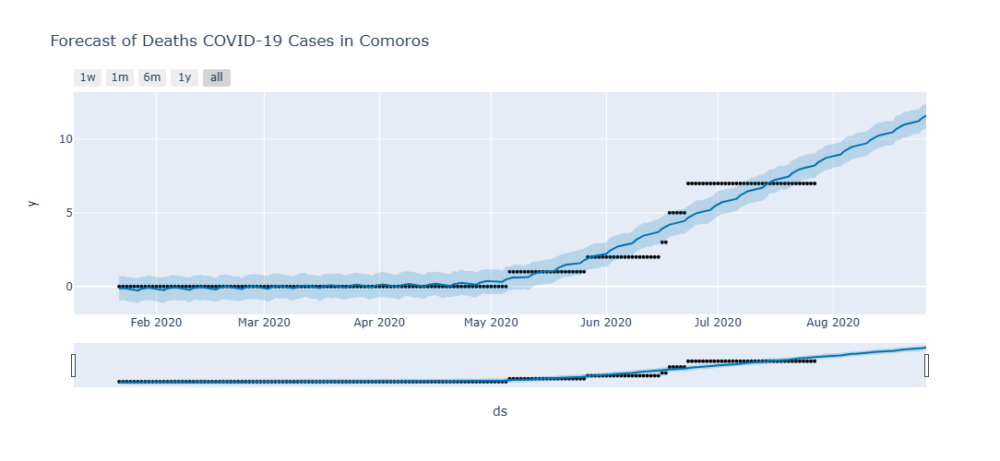

Processing: Mongolia


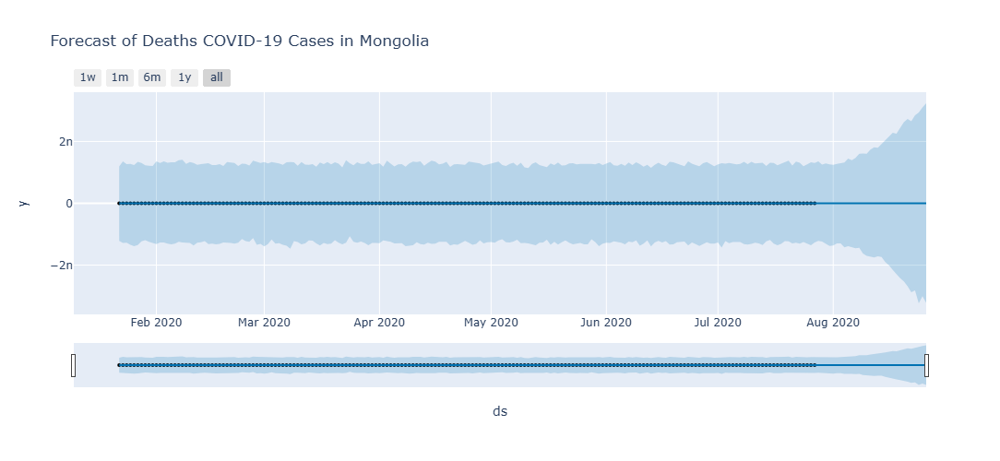

In [25]:
random.seed(4)

# list of unique countries
countries = covid_df['Country/Region'].unique()

# Randomly select 5 countries
random_countries = random.sample(list(countries), 5)

# Loop through each selected country
for country in random_countries:
    print(f"Processing: {country}")

    df_meta = covid_df[covid_df['Country/Region'] == country]
    country_ts = df_meta.groupby('Date')['Deaths'].sum().reset_index()
    country_ts.rename(columns={'Date': 'ds', 'Deaths': 'y'}, inplace=True)

    # Fit the model
    model = Prophet()
    model.fit(country_ts)

    # Create future dates and forecast
    future = model.make_future_dataframe(periods=30)
    forecast = model.predict(future)

    # Visualising
    fig = plot_plotly(model, forecast)
    fig.update_layout(title=f"Forecast of Deaths COVID-19 Cases in {country}", width=900, height=500)
    fig.show()